## SpaGFT Tutorial: Visium Mouse Brain (H&E-coronal)

### Outline
1. Import packages
2. Download and load Visium data
3. QC and preprocessing
4. Function: identify and visualize spatially variable genes
5. Function: characterize tissue modules
6. Function: gene expression enhancement

The installation steps can be found [here](https://spagft.readthedocs.io/en/latest/Installation.html).
SpaGFT is a python package to analyze spatial transcriptomics data. To install SpaGFT, the python version is required to >= 3.7. You can check your python version by:

In [1]:
import platform
platform.python_version()

'3.8.0'

### 1. Import packages

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import SpaGFT as spg
import os
import matplotlib.pyplot as plt
from plotnine import *
import gseapy as gp


sc.settings.set_figure_params(dpi=100, frameon=False, figsize=(7, 7),
                              facecolor='white')

Define the folder to save the results:

In [3]:
results_folder = './results/mouse_brain_analysis/'

### 2. Download and load Visium data

In [4]:
!mkdir data
!wget https://bmblx.bmi.osumc.edu/downloadFiles/datasets_in_SpaGFT.zip
!unzip -d ./data datasets_in_SpaGFT.zip

mkdir: cannot create directory ‘data’: File exists
--2023-01-09 23:44:01--  https://bmblx.bmi.osumc.edu/downloadFiles/datasets_in_SpaGFT.zip
Resolving bmblx.bmi.osumc.edu (bmblx.bmi.osumc.edu)... 140.254.127.249
Connecting to bmblx.bmi.osumc.edu (bmblx.bmi.osumc.edu)|140.254.127.249|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 294261142 (281M) [application/zip]
Saving to: ‘datasets_in_SpaGFT.zip’

datasets_in_SpaGFT. 100%[===================>] 280.63M   561KB/s    in 8m 48s  

2023-01-09 23:52:53 (544 KB/s) - ‘datasets_in_SpaGFT.zip’ saved [294261142/294261142]

Archive:  datasets_in_SpaGFT.zip
   creating: ./data/151673/
   creating: ./data/151673/filtered_feature_bc_matrix/
  inflating: ./data/151673/filtered_feature_bc_matrix/barcodes.tsv.gz  
  inflating: ./data/151673/filtered_feature_bc_matrix/features.tsv.gz  
  inflating: ./data/151673/filtered_feature_bc_matrix/matrix.mtx.gz  
  inflating: ./data/151673/filtered_feature_bc_matrix.h5  
   creating: 

After downloading and uncompressing file, load data as the below chunk:

In [5]:
data_dir = "./data"
sample = "mouse-he-coronal"
adata = sc.read_visium(os.path.join(data_dir, sample))
adata.var_names_make_unique()
adata.raw = adata

### 3. QC and preprocessing

In [6]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

### 4. Function: identify and visualize spatially variable genes

In [7]:
gene_df = spg.rank_gene_smooth(adata, 
                               spatial_info=['array_row', 'array_col'],
                               ratio_low_freq=0.5,
                               ratio_high_freq=3,
                               ratio_neighbors=1,
                               filter_peaks=True,
                               S=5)
svg_list = gene_df[gene_df.cutoff_gft_score]\
    [gene_df.qvalue < 0.05].index.tolist()
gene_df = gene_df.loc[svg_list, :]

Graph Fourier Transform finished!
SVG ranking could be found in adata.var['svg_rank']
The spatially variable genes judged by gft_score could be found 
          in adata.var['cutoff_gft_score']
Gene signals in frequency domain when detect SVGs could be found
          in adata.varm['freq_domain_svg']


#### 4.1 Visualize some SVGs and their spatial domain

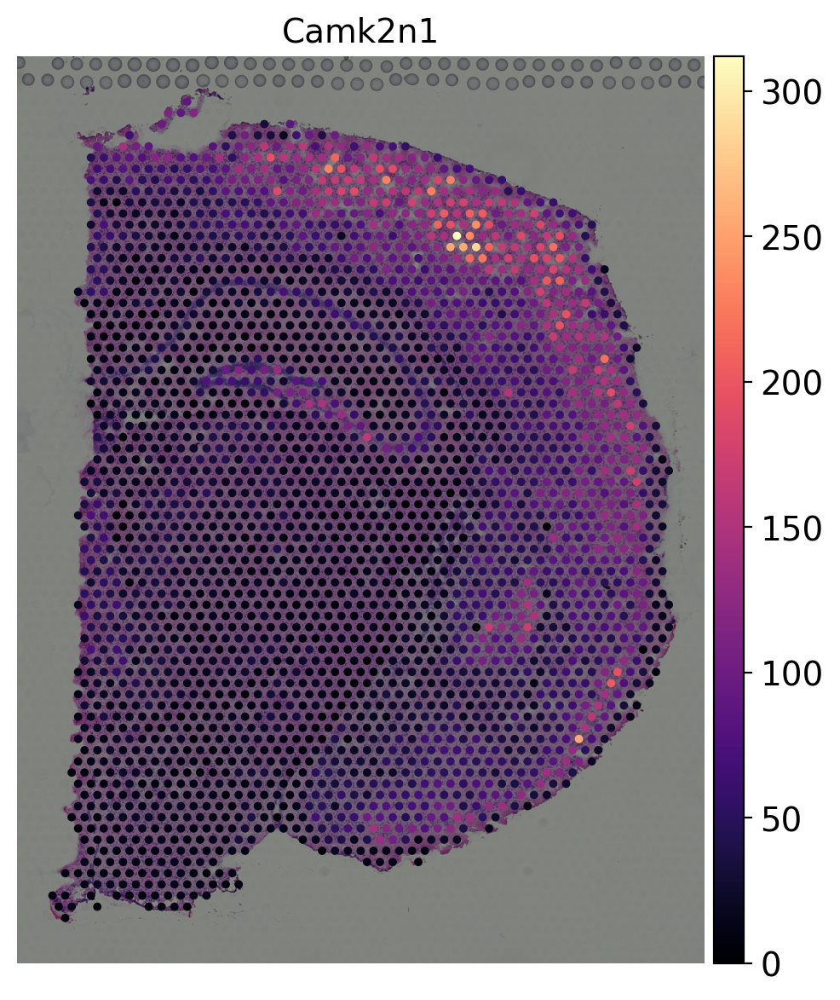

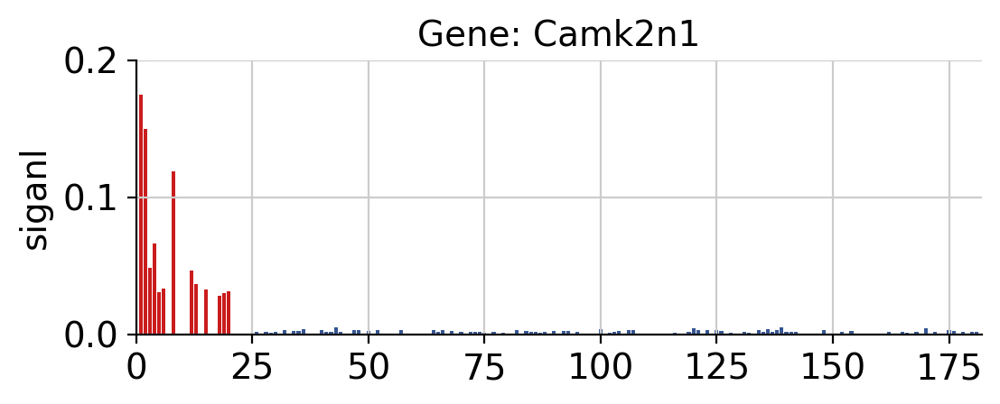

In [8]:
for gene in svg_list[:1]:
    sc.pl.spatial(adata, color=gene, cmap='magma')
    spg.plot.svg_freq_signal(adata, gene)

#### 4.2 Visualize all genes' frequency signals by UMAP

The umap coordinates of genes when identify SVGs could be found in 
          adata.varm['freq_umap_svg']


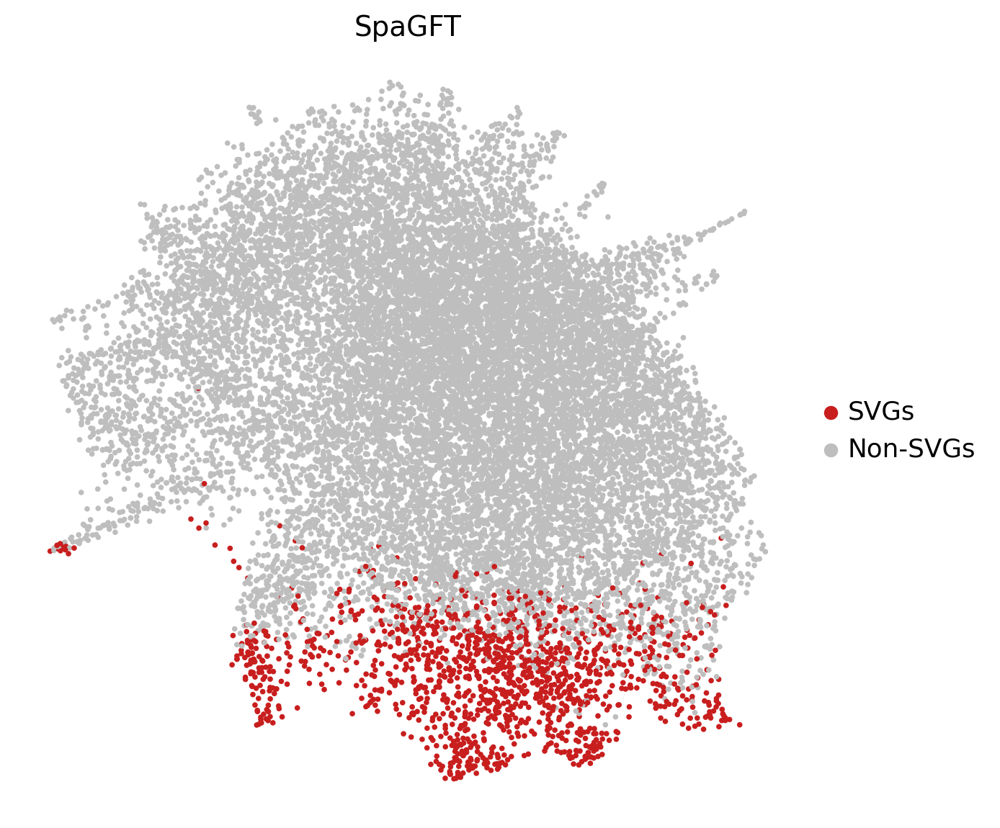

In [9]:
spg.plot.gene_signal_umap(adata, svg_list, s=30)

### 5. Function: characterize tissue modules

In [10]:
spg.gft.find_tissue_module(adata,
                           svg_list = svg_list,
                           ratio_fms=2,
                           resolution=1,
                           n_neighbors=15,
                           sub_resolution=0.5,
                           sub_n_neighbors=8,
                           quantile=0.75)
gene_df = adata.var.loc[svg_list, :]

#### 5.1 UMAP of clustering result

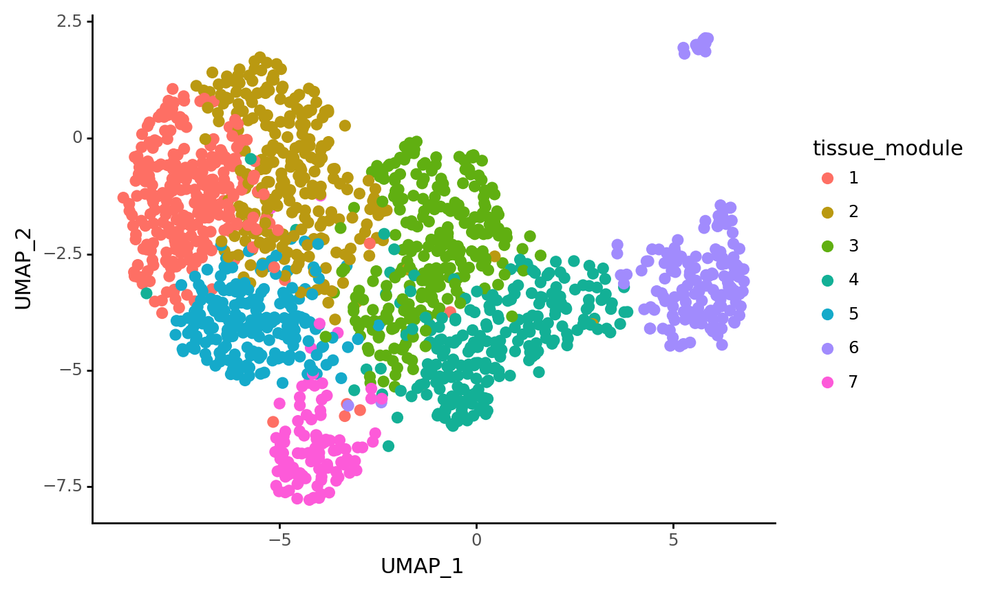

In [11]:
plot_df = pd.concat((adata.uns['gft_umap_tm'], gene_df.tissue_module), axis=1)
plot_df.tissue_module = pd.Categorical(plot_df.tissue_module,
                                categories=np.unique(plot_df.tissue_module))
base_plot = (ggplot(plot_df, aes('UMAP_1', 'UMAP_2', fill='tissue_module'))
              + geom_point(size=3.5, stroke=0)
              + scale_fill_hue(s=0.99, l=0.65, h=0.0417, color_space='husl')
              + theme_classic())
print(base_plot)

#### 5.2 Visualize top three genes determining a tissue module

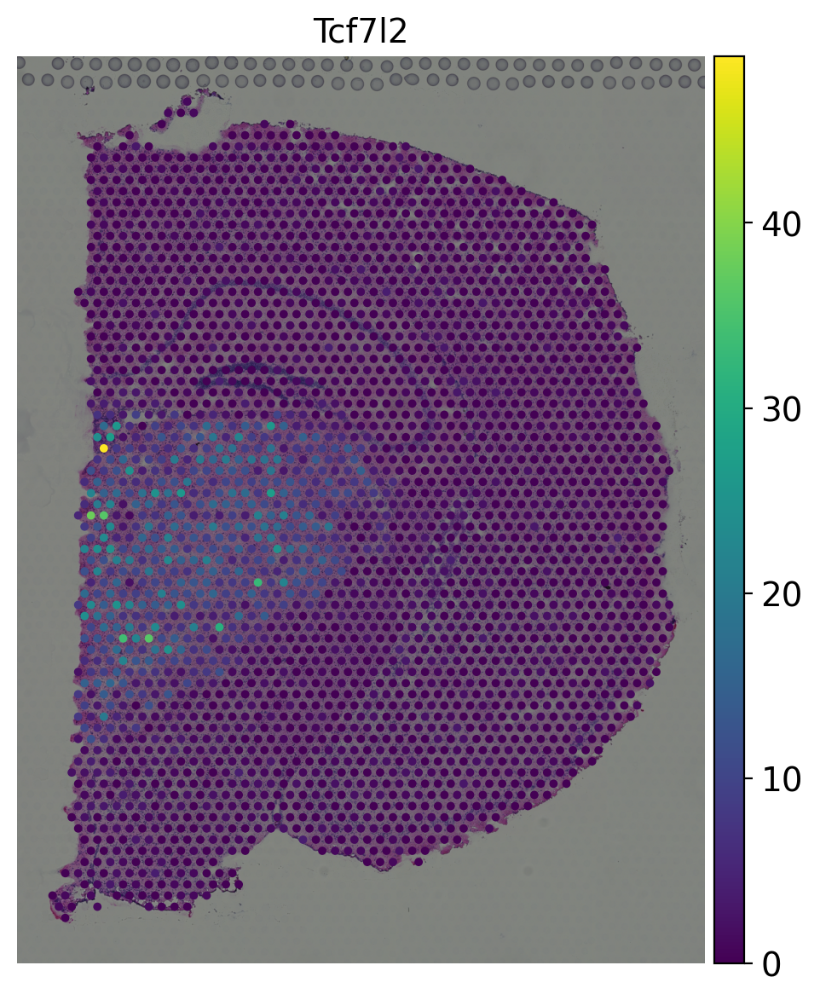

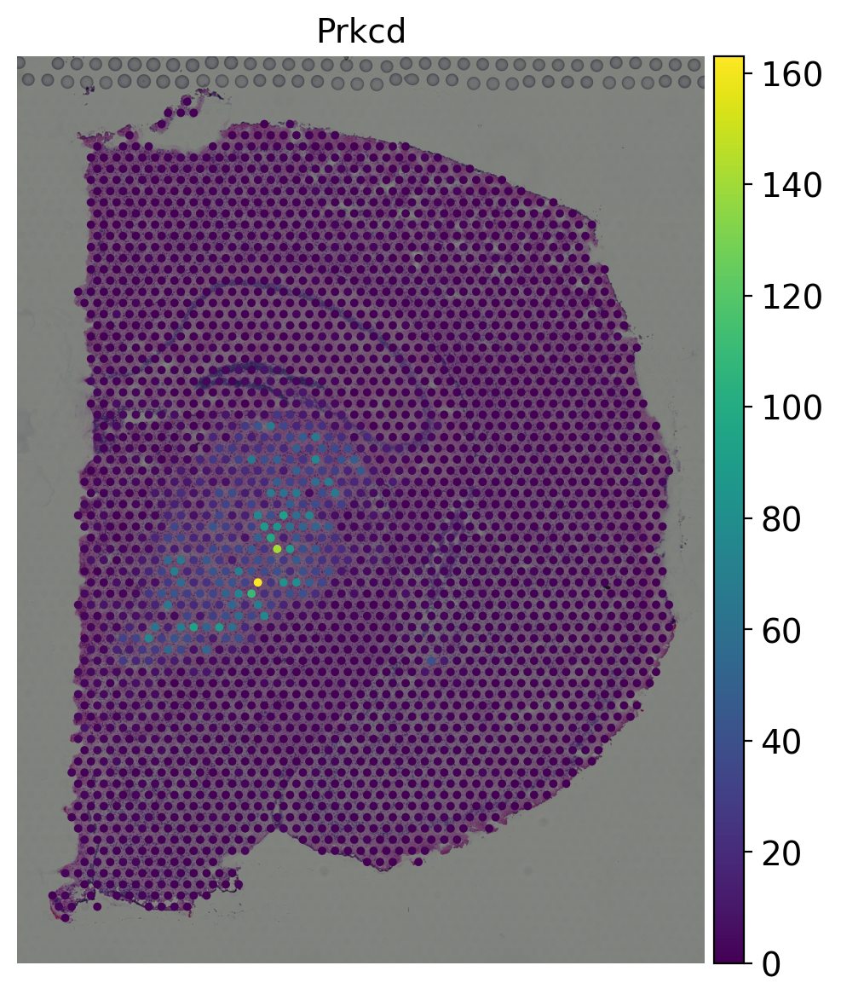

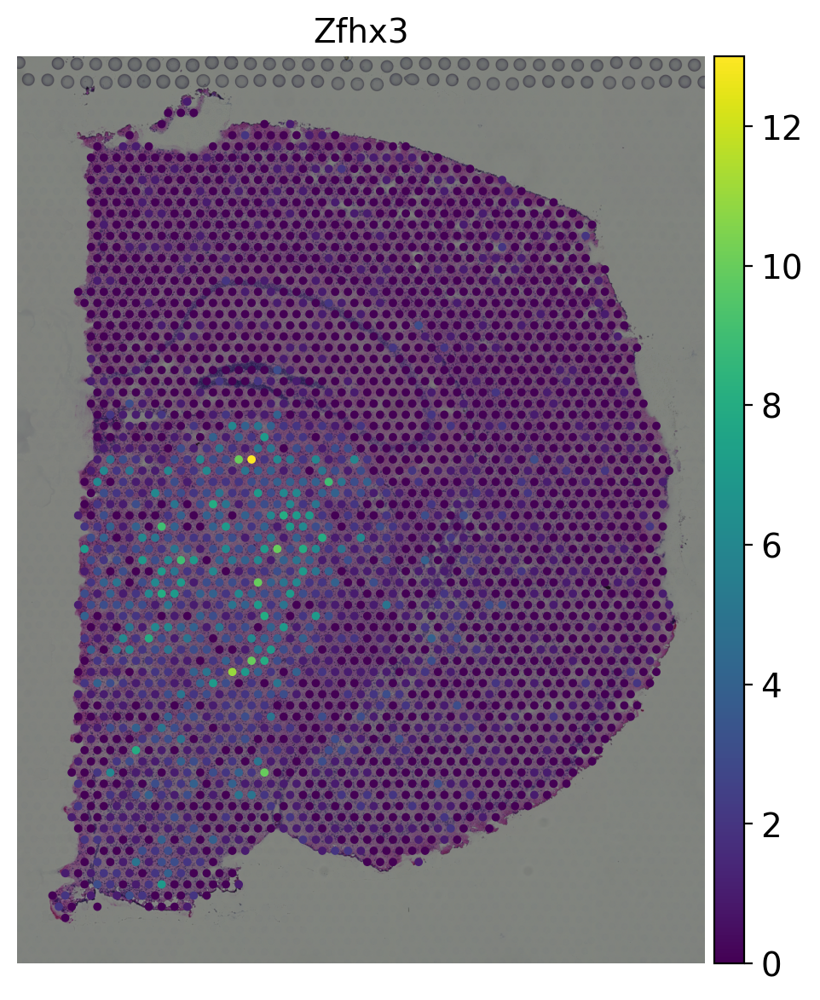

In [12]:
for gene in gene_df[gene_df.tissue_module == '7'].index[:3]:
    sc.pl.spatial(adata, color=gene)

#### 5.3 Visualize tissue modules

##### 5.3.1 Visualize frequency signals of top three Tissue Modules or sub-TM

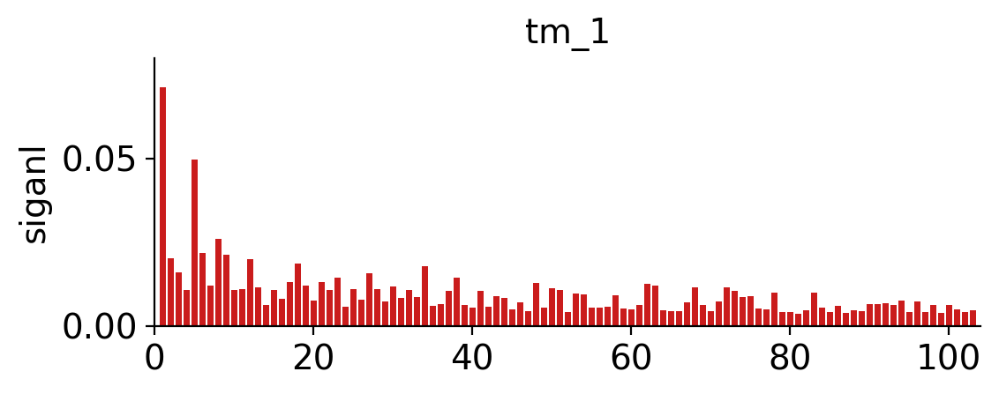

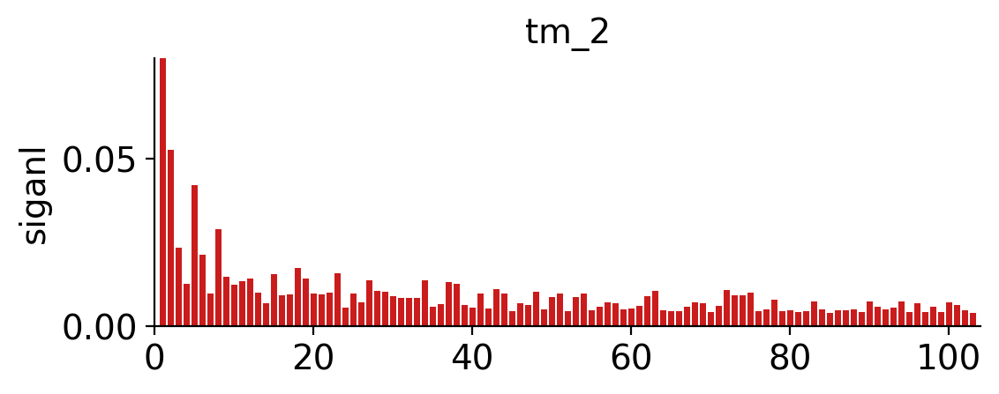

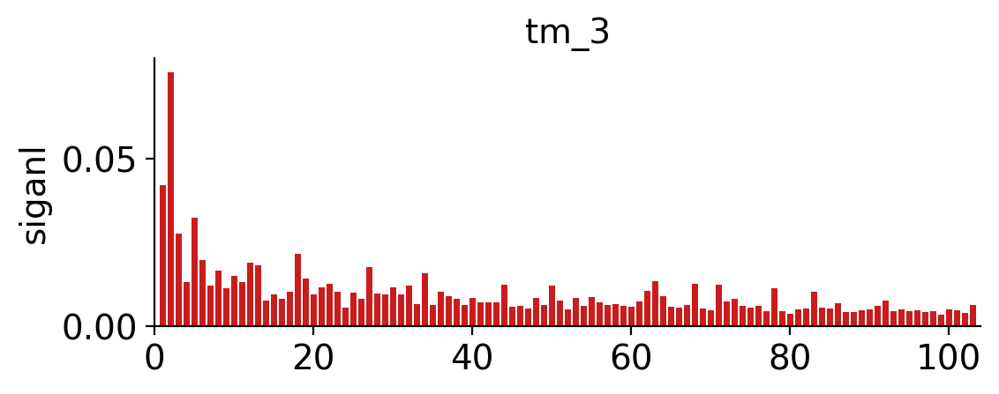

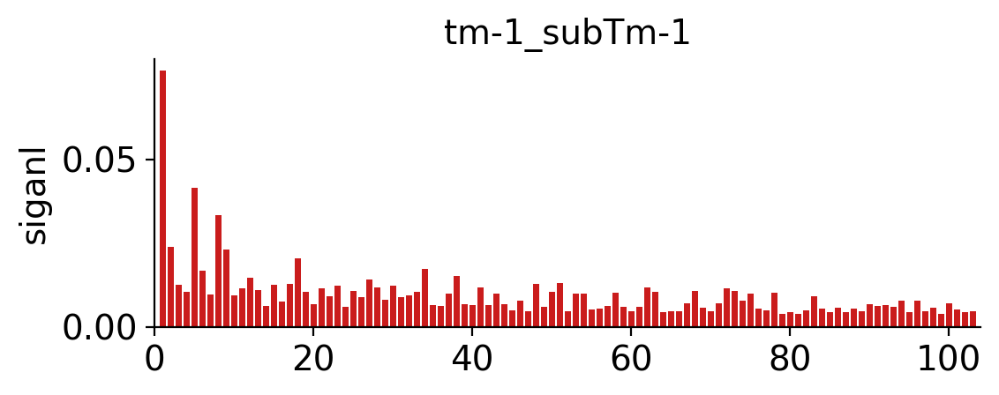

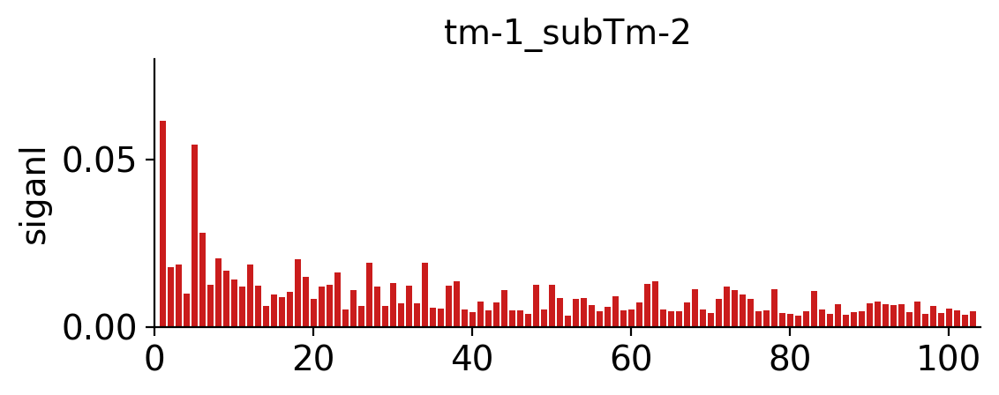

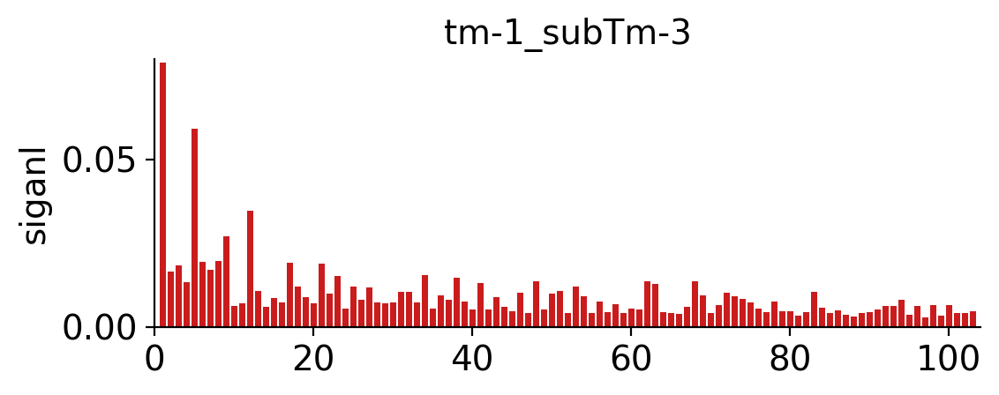

In [13]:
tm_df = adata[:, svg_list].var
all_tms = adata.uns['freq_signal_tm'].index[:3]
for tm in all_tms:
    signal = adata.uns['freq_signal_tm'].loc[tm, :]
    ax = spg.plot.tm_freq_signal(adata, tm, return_fig=True)
all_subTMs = adata.uns['freq_signal_subTM'].index[:3]
for subTM in all_subTMs:
    signal = adata.uns['freq_signal_subTM'].loc[subTM, :]
    ax = spg.plot.subTm_freq_signal(adata, subTM, return_fig=True)

##### 5.3.2 Visualize on tissue module, including pseudo_expression

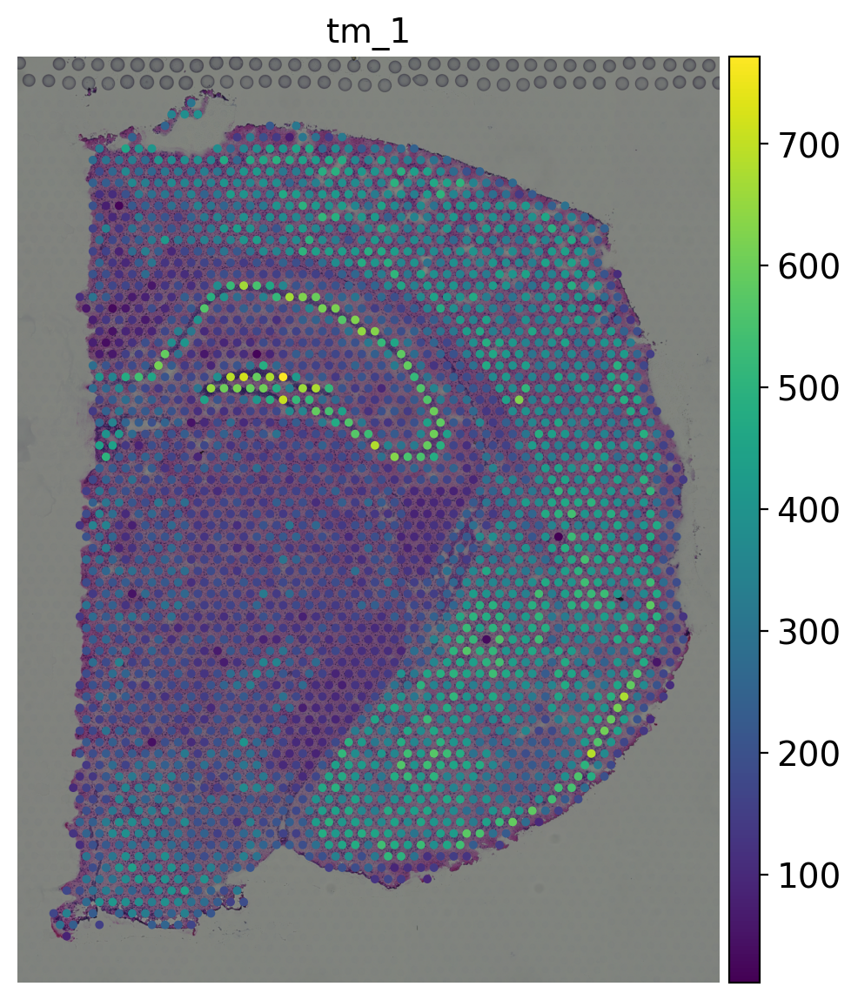

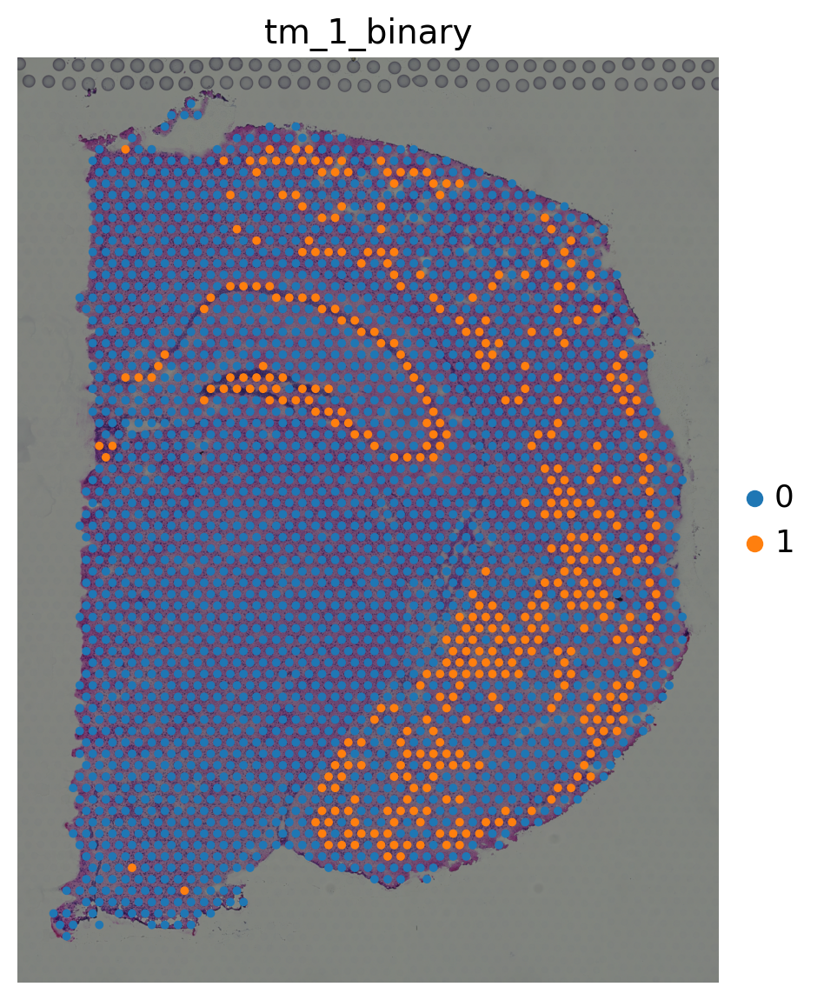

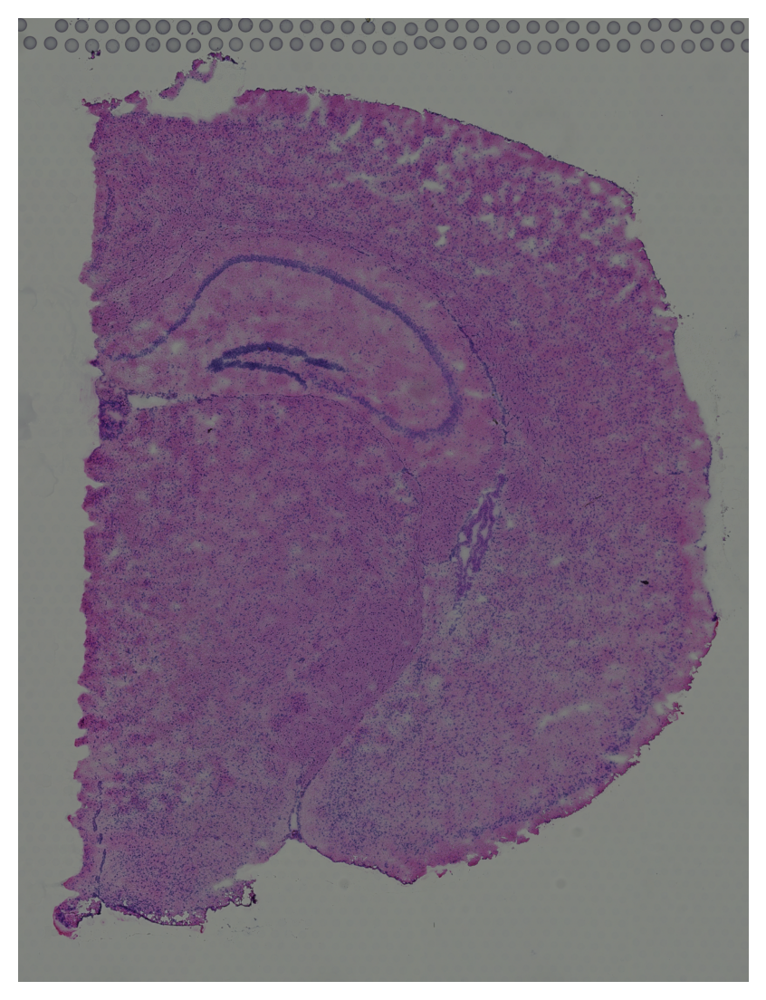

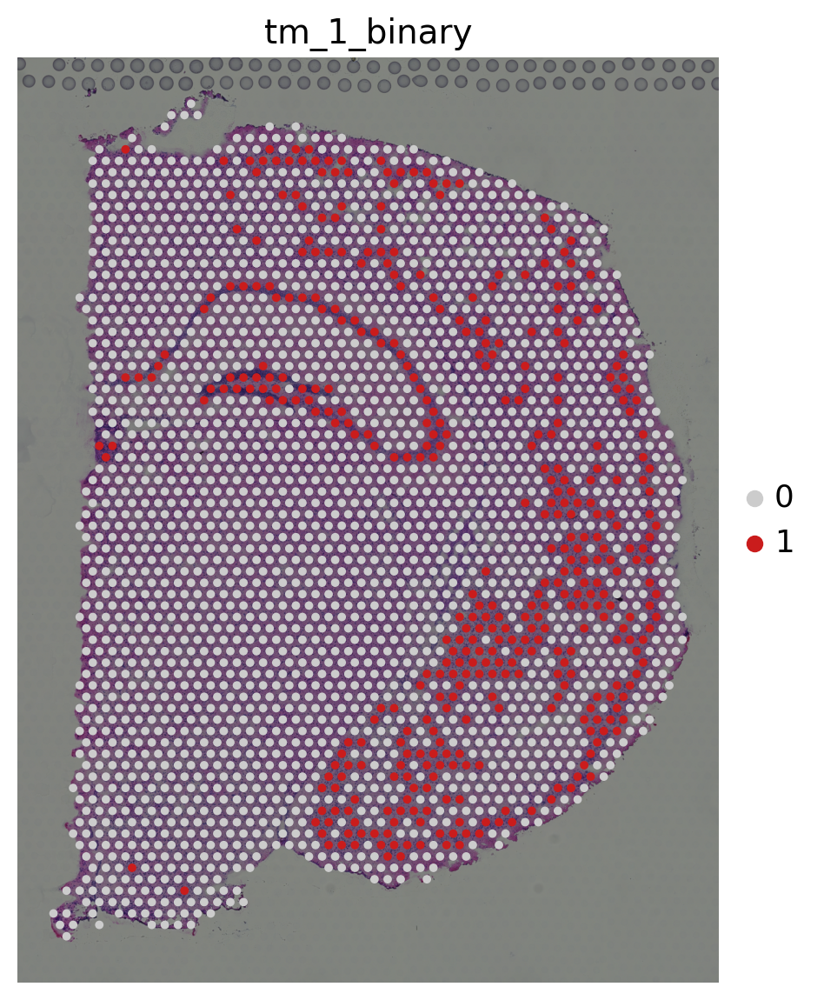

In [14]:
adata.obs['tm_1'] = adata.obsm['tm_pseudo_expression']['tm_1']
sc.pl.spatial(adata, color='tm_1')
adata.obs['tm_1_binary'] = adata.obsm['tm_binary']['tm_1']
sc.pl.spatial(adata, color='tm_1_binary')
adata.uns['tm_1_binary_colors'] = ['#CCCCCC', '#CA1C1C']
sc.pl.spatial(adata)
sc.pl.spatial(adata, color='tm_1_binary')

#### 5.4 Biological pathway enrichment analysis for detected tissue modules

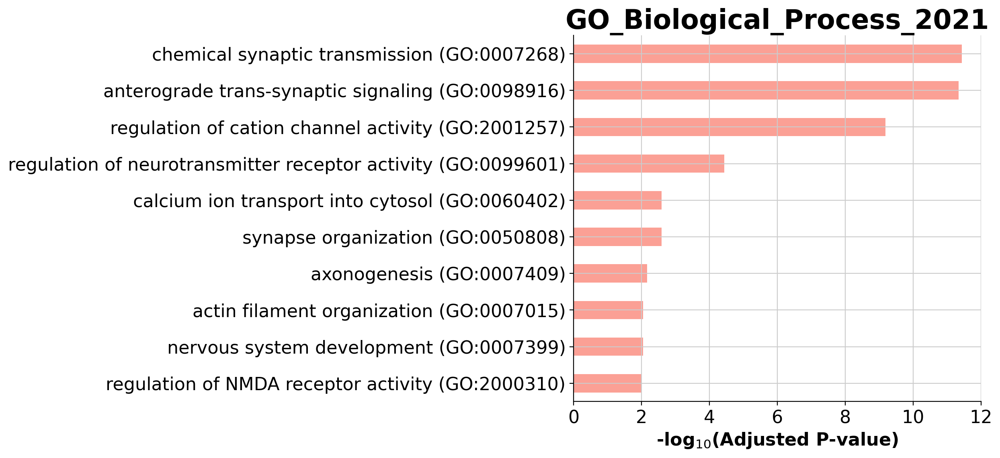

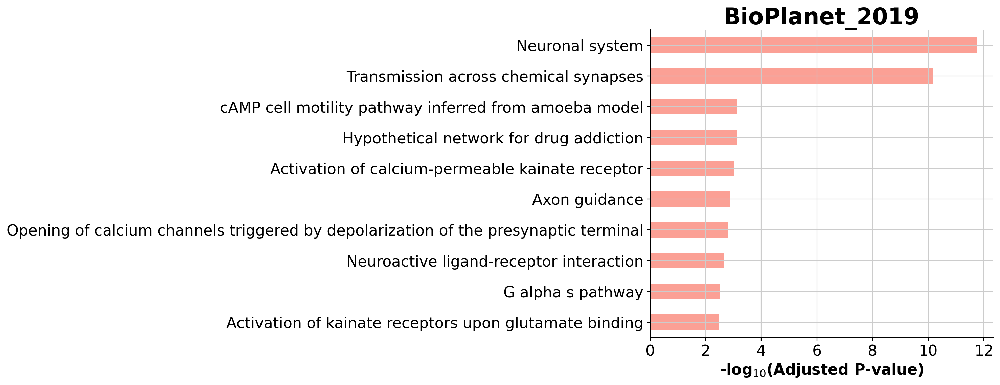

In [15]:
tm_gene_list = tm_df[tm_df.tissue_module == '1'].index.tolist()
enr = gp.enrichr(gene_list=tm_gene_list,
                  gene_sets=['BioPlanet_2019','GO_Biological_Process_2021',
                            'ChEA_2016'],
                  organism='Human', 
                  description='Tissue_module',
                  outdir='test/enrichr_kegg',
                  no_plot=False,
                  cutoff=0.5 # test dataset, use lower value from range(0,1)
                )
enr_results = enr.results
from gseapy.plot import barplot, dotplot
barplot(enr.results[enr.results.Gene_set=='GO_Biological_Process_2021'],
        title='GO_Biological_Process_2021')
barplot(enr.results[enr.results.Gene_set=='BioPlanet_2019'],
        title='BioPlanet_2019')

### 6. Function: gene expression enhancement

In [16]:
# To quickly demonstrate the enhancement function
# we set the parameter ratio_low_freq as 15 in this tutorial.
new_adata = adata.copy()
spg.low_pass_enhancement(new_adata,
                        ratio_low_freq=15,
                        inplace=True)

,Xkr4,Gm19938,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,...,mt-Nd5,mt-Nd6,mt-Cytb,CAAA01118383.1,Vamp7,Spry3,Tmlhe,4933409K07Rik,CAAA01147332.1,AC149090.1
AAACAAGTATCTCCCA-1,0.060592,0.173525,0.005587,0.539421,0.276276,0.565600,0.498996,1.500089,0.000000,0.006730,...,4.049490,0.975129,6.259859,0.006469,0.205492,0.178628,0.000000,0.010836,0.003686,1.115164
AAACAATCTACTAGCA-1,0.054361,0.360753,0.000000,1.044102,0.497720,0.916271,0.101626,0.917439,0.000000,0.007201,...,4.341545,1.192843,6.247155,0.026091,0.198265,0.002354,0.000000,0.024829,0.020713,1.276114
AAACACCAATAACTGC-1,0.032117,0.132303,0.060977,0.478546,0.350480,0.687833,0.301573,0.948530,0.142318,0.000000,...,3.743253,0.888038,5.931350,0.265885,0.783364,0.074830,0.000000,0.003628,0.000000,1.165521
AAACAGAGCGACTCCT-1,0.000000,0.140193,0.000000,0.511087,0.210056,0.690864,0.405991,1.118040,0.023993,0.059297,...,4.167697,1.046600,6.177745,0.301955,0.346513,0.006901,0.061886,0.000000,0.000210,1.402761
AAACCGGGTAGGTACC-1,0.079667,0.000000,0.027736,0.746541,0.049991,1.042286,0.428536,1.114546,0.042184,0.010835,...,3.845631,0.678143,6.026553,0.094954,0.446442,0.359256,0.045784,0.000000,0.000000,1.414070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,0.275539,0.000000,0.232062,0.288311,0.302964,0.440973,0.375601,1.219376,0.084817,0.000930,...,3.468834,0.471270,5.870028,0.555459,0.363067,0.000000,0.033857,0.011783,0.014781,1.017548
TTGTTTCACATCCAGG-1,0.088368,0.131385,0.121762,0.806298,0.551178,0.754277,0.252240,1.074822,0.240761,0.048143,...,3.734108,0.872211,5.831311,0.011128,0.614860,0.176488,0.000000,0.000000,0.000000,0.547918
TTGTTTCATTAGTCTA-1,0.164636,0.150202,0.059134,0.425879,0.686620,0.455969,0.199225,1.060193,0.389107,0.066068,...,3.681905,1.506758,5.873998,0.658148,0.313866,0.106237,0.105816,0.000000,0.000000,1.529737
TTGTTTCCATACAACT-1,0.403349,0.000000,0.143587,0.674972,0.564007,0.917612,0.311053,0.755384,0.085054,0.000000,...,3.921365,1.544726,6.096420,0.454598,0.637235,0.024313,0.011123,0.000000,0.040878,1.170766


Before enhancement:

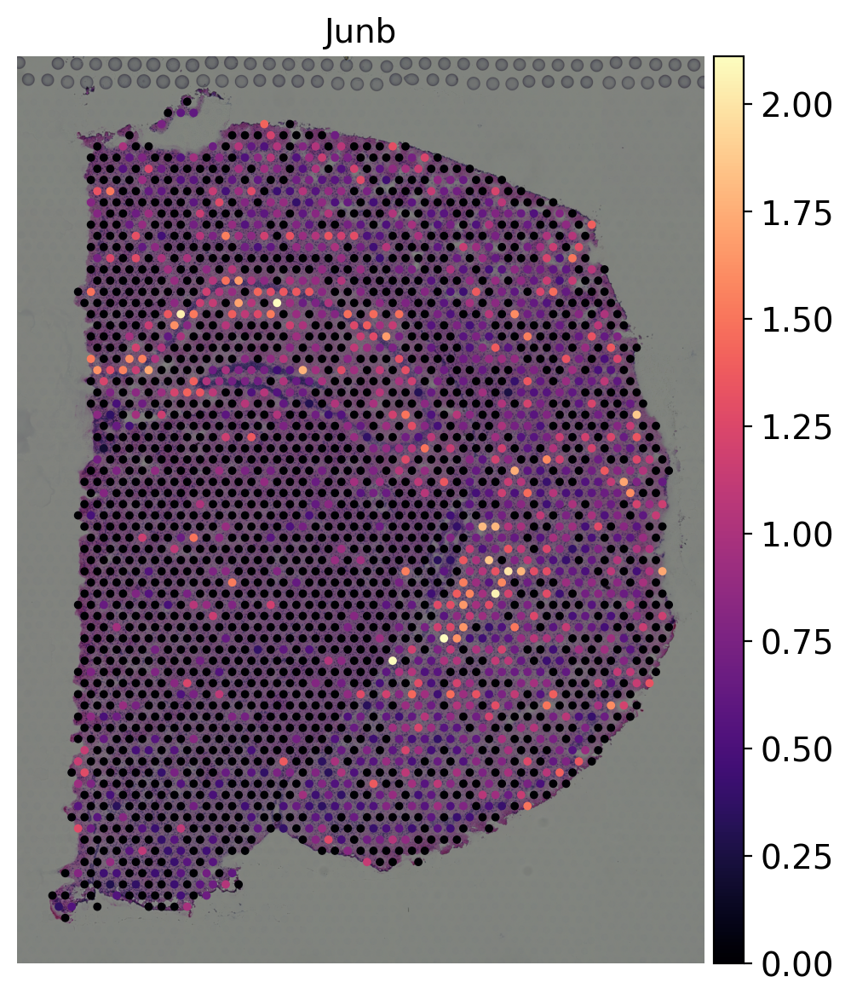

In [18]:
sc.pl.spatial(adata, color='Junb', cmap='magma', use_raw=False)

After enhancement:

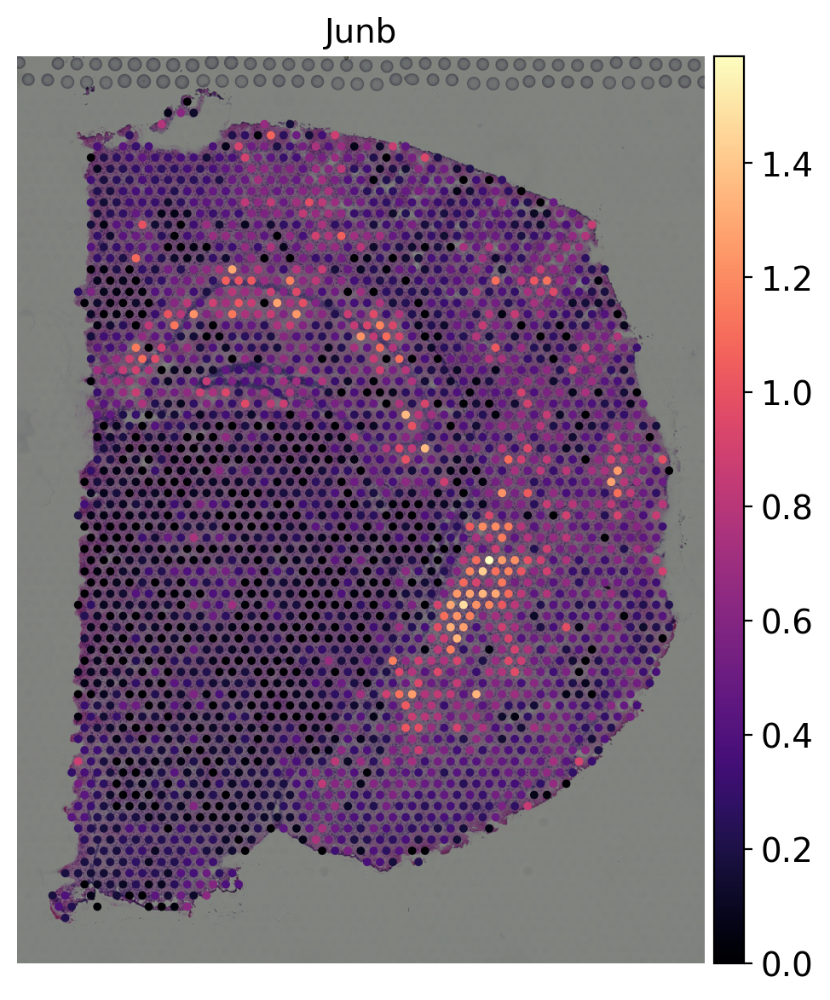

In [20]:
sc.pl.spatial(new_adata, color='Junb', cmap='magma', use_raw=False)